# **1. Chargement et Prétraitement des Données :**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score

In [ ]:
df = pd.read_csv('/content/sample_data/GlobalWeatherRepository.csv', index_col=None)
df.info()
#the first column of the CSV file will be treated as the index column by default , df.info shape of the dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42461 entries, 0 to 42460
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   country                       42461 non-null  object 
 1   location_name                 42461 non-null  object 
 2   latitude                      42461 non-null  float64
 3   longitude                     42461 non-null  float64
 4   timezone                      42461 non-null  object 
 5   last_updated_epoch            42461 non-null  int64  
 6   last_updated                  42461 non-null  object 
 7   temperature_celsius           42461 non-null  float64
 8   temperature_fahrenheit        42461 non-null  float64
 9   condition_text                42461 non-null  object 
 10  wind_mph                      42461 non-null  float64
 11  wind_kph                      42461 non-null  float64
 12  wind_degree                   42461 non-null  int64  
 13  w

In [ ]:
df.isna().sum()

,0
country,0
location_name,0
latitude,0
longitude,0
timezone,0
last_updated_epoch,0
last_updated,0
temperature_celsius,0
temperature_fahrenheit,0
condition_text,0


# **2. Nettoyage des Données :**

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Corrected list of desired columns with no extra spaces or concatenation issues
desired_columns = [
    'country', 'location_name', 'temperature_celsius', 'temperature_fahrenheit',
    'condition_text', 'wind_mph', 'wind_kph', 'wind_degree', 'wind_direction',
    'pressure_mb', 'pressure_in', 'precip_mm', 'precip_in', 'humidity', 'cloud',
    'feels_like_celsius', 'feels_like_fahrenheit', 'visibility_km', 'visibility_miles',
    'uv_index', 'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
    'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide', 'air_quality_PM2.5',
    'air_quality_PM10', 'air_quality_us-epa-index', 'air_quality_gb-defra-index'
]

# Fixing DataFrame by ensuring all desired columns exist and stripping leading/trailing spaces
df.columns = df.columns.str.strip()  # Removing leading/trailing spaces in column names

# Select desired columns, if they exist in df
selected_columns = df[desired_columns]

# Use select_dtypes to extract numeric columns
numeric_columns = selected_columns.select_dtypes(include=['float64', 'int64']).columns

# Scale the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(selected_columns[numeric_columns])

# Create a new DataFrame with scaled data and appropriate column names
scaled_df = pd.DataFrame(scaled_data, columns=numeric_columns)

print(scaled_df)


       temperature_celsius  temperature_fahrenheit  wind_mph  wind_kph  \
0                 0.798870                0.798493  0.055741  0.054709   
1                 0.778531                0.778406  0.017837  0.017313   
2                 0.789831                0.789705  0.065775  0.065097   
3                 0.588701                0.588826  0.042363  0.042244   
4                 0.755932                0.755807  0.000000  0.000000   
...                    ...                     ...       ...       ...   
42456             0.823729                0.823603  0.017837  0.017313   
42457             0.744633                0.744507  0.037904  0.037396   
42458             0.708475                0.708098  0.032330  0.032548   
42459             0.770621                0.770873  0.032330  0.032548   
42460             0.729944                0.730069  0.042363  0.042244   

       wind_degree  pressure_mb  pressure_in  precip_mm  precip_in  humidity  \
0         0.203343     0.396552

In [ ]:
# Create a copy of the original DataFrame to avoid unwanted modifications
data = scaled_df.copy()

# Define a function to print unique values for a given column
def unique(column_name):
    print(f"Unique values for '{column_name}':")
    unique_values = data[column_name].unique()

    # Display the unique values
    for value in unique_values:
        print(f"- {value}")

    print("-----------------------------------")

# Loop through all columns in the DataFrame
for column in data.columns:
    unique(column)


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
- 0.029326830520438947
- 0.06186228582429572
- 0.06205480331130078
- 0.019380093691843674
- 0.06629018802541231
- 0.09491112109349933
- 0.0347173201565809
- 0.10415196046974268
- 0.0342681126869024
- 0.028300070589745235
- 0.02175447603157287
- 0.08836552653532695
- 0.0539048963614195
- 0.040877879740743125
- 0.045177436950523016
- 0.06802284540845793
- 0.5639478919335174
- 0.028492588076750307
- 0.0735416800359366
- 0.015658088943078997
- 0.08599114419559777
- 0.031637040364499776
- 0.07103895270487069
- 0.028428415581081945
- 0.023551305910286854
- 0.20150163639863955
- 0.03567990759160624
- 0.06564846306872874
- 0.019444266187512035
- 0.022460373483924795
- 0.13739331322595136
- 0.03048193544246936
- 0.16453827889366618
- 0.04896361419495605
- 0.046525059359558495
- 0.05351986138740936
- 0.5826862606686775
- 0.020856061092215876
- 0.055252518770454985
- 0.01790412629147148
- 0.11005583007123147
- 0.1072322

In [ ]:
# Define a function to perform feature engineering
def feature_engineering(data):
    #  a function that shows interaction terms between temperature and humidity, as well as between pressure and precipitation
    data['temperature_humidity_interaction'] = data['temperature_celsius'] * data['humidity']
    data['pressure_precip_interaction'] = data['pressure_mb'] * data['precip_mm']

# Perform feature engineering
feature_engineering(data)

# Print unique values for each column
for i in data.columns:
    unique(i)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
- 0.495451103733473
- 0.6871221387384239
- 0.07921253421864989
- 0.05463335080668646
- 0.3285223367697594
- 0.43160347137282307
- 0.5370376841982643
- 0.2290523618148989
- 0.26918282951831785
- 0.21317490826489605
- 0.4218999359310384
- 0.30136874599568986
- 0.6687052245325877
- 0.15842506843729978
- 0.14953695614188361
- 0.6078630089114101
- 0.3177820490418778
- 0.02841167219989516
- 0.09307472770691361
- 0.6368454773137631
- 0.27122138738423907
- 0.1692818451860912
- 0.12773021142757296
- 0.2816704525598462
- 0.3344632768361582
- 0.10117071466014327
- 0.09505504106237987
- 0.07816413303046187
- 0.6211777040013978
- 0.38946939250975593
- 0.5624322907565962
- 0.22634981652979208
- 0.3739297571203914
- 0.20201526006173917
- 0.39804298444871566
- 0.3803133554662473
- 0.03443415458093074
- 0.6253130642436949
- 0.33222668763469043
- 0.4036111596482031
- 0.0942396179160114
- 0.0936571728114625
- 0.1832372298910827

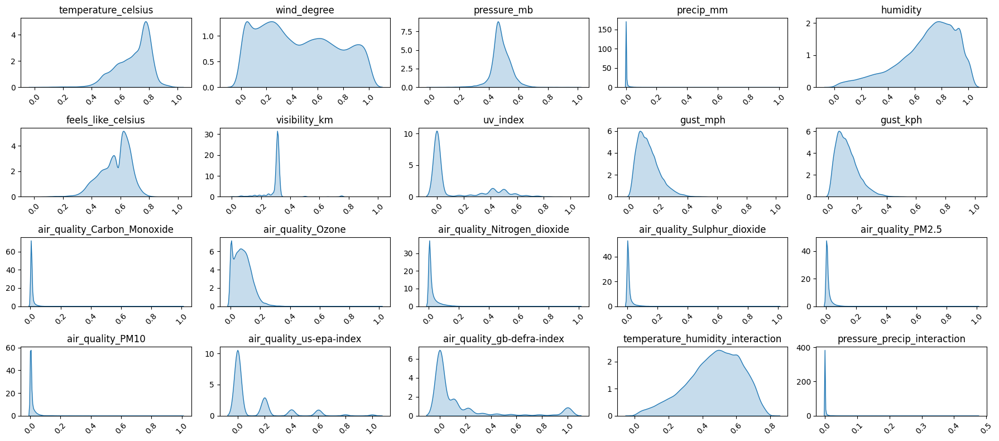

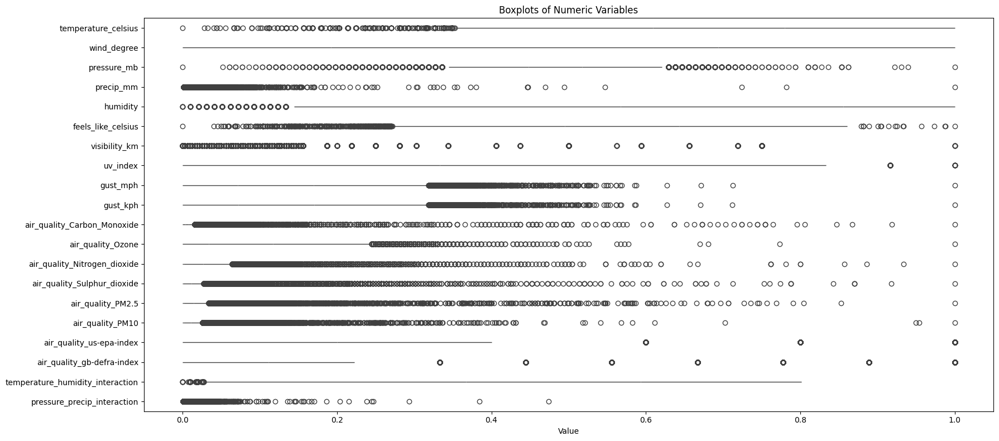

In [ ]:
plt.figure(figsize=(18, 8))

# Select numeric columns for visualization
numeric_cols = ['temperature_celsius', 'wind_degree', 'pressure_mb', 'precip_mm',
                'humidity', 'feels_like_celsius', 'visibility_km', 'uv_index',
                'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
                'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide', 'air_quality_PM2.5',
                'air_quality_PM10', 'air_quality_us-epa-index', 'air_quality_gb-defra-index','temperature_humidity_interaction',
                'pressure_precip_interaction']

# Plot KDE plots for numeric columns
for i, col in enumerate(numeric_cols):
    plt.subplot(4, 5, i + 1)
    sns.kdeplot(data[col].dropna(), fill=True)  # Updated parameter to fill=True
    plt.title(col)
    plt.xlabel('')
    plt.ylabel('')
    plt.xticks(rotation=45)
    plt.tight_layout()

plt.show()

# Boxplots for the same numeric columns
plt.figure(figsize=(18, 8))
sns.boxplot(data=data[numeric_cols].dropna(), orient='h', width=0, color='skyblue')  # Updated parameters width=0 and color='skyblue'
plt.xlabel('Value')
plt.title('Boxplots of Numeric Variables')
plt.tight_layout()
plt.show()


# **3. Analyse Exploratoire des Données (EDA) :**

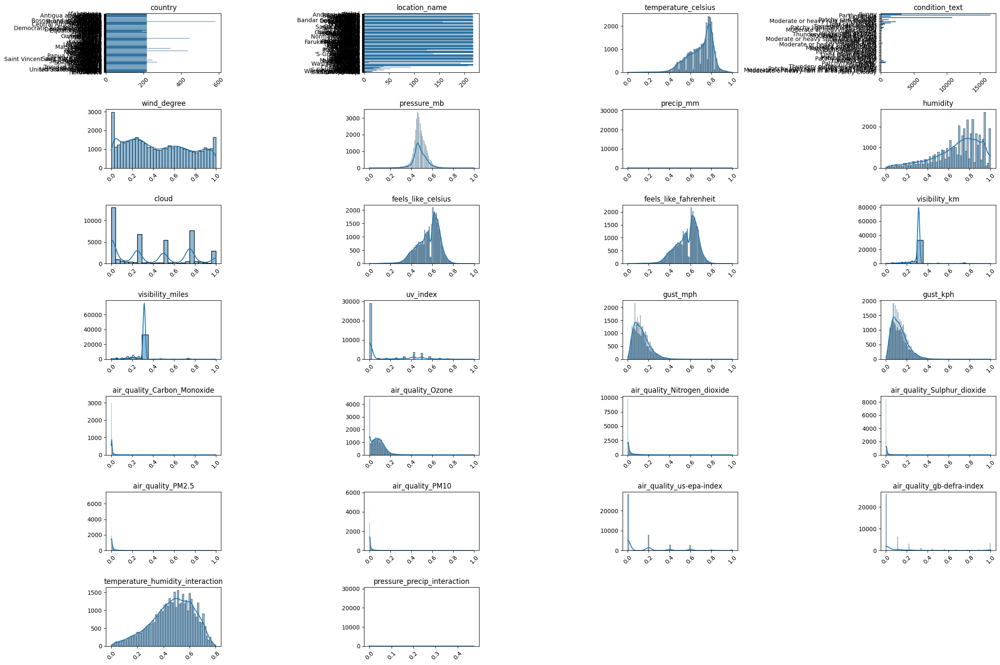

In [ ]:
import seaborn as sns

# Set up figure and axes
plt.figure(figsize=(24, 16))

# Select columns for visualization
columns_to_plot = ['country', 'location_name', 'temperature_celsius', 'condition_text',
                   'wind_degree', 'pressure_mb', 'precip_mm', 'humidity', 'cloud',
                   'feels_like_celsius', 'feels_like_fahrenheit', 'visibility_km',
                   'visibility_miles', 'uv_index', 'gust_mph', 'gust_kph',
                   'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
                   'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
                   'air_quality_PM2.5', 'air_quality_PM10',
                   'air_quality_us-epa-index', 'air_quality_gb-defra-index',
                   'temperature_humidity_interaction', 'pressure_precip_interaction']

# Plot each column
for i, col in enumerate(columns_to_plot):
    plt.subplot(7, 4, i + 1)  # Adjust the number of subplots per row and column
    if col in ['country', 'location_name', 'condition_text']:
        sns.countplot(data=df[col].dropna())
    else:
        sns.histplot(data[col].dropna(), kde=True)  # Use histplot for numeric columns
    plt.title(col)
    plt.xlabel('')
    plt.ylabel('')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

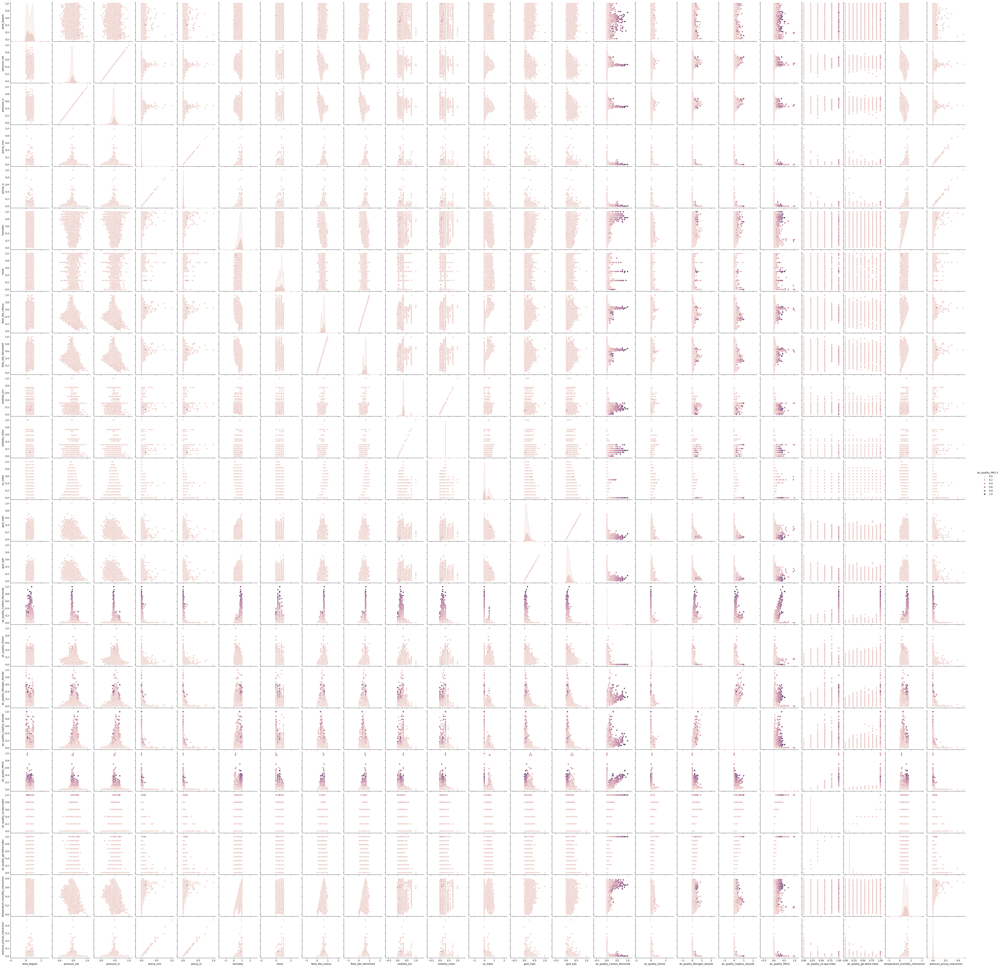

In [ ]:
sns.pairplot(data.iloc[:,4:], hue = "air_quality_PM2.5")
plt.show()
#generates a grid of scatterplots, where each scatterplot shows the relationship between two variables in the dataset

In [ ]:
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42461 entries, 0 to 42460
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   country                       42461 non-null  object 
 1   location_name                 42461 non-null  object 
 2   latitude                      42461 non-null  float64
 3   longitude                     42461 non-null  float64
 4   timezone                      42461 non-null  object 
 5   last_updated_epoch            42461 non-null  int64  
 6   last_updated                  42461 non-null  object 
 7   temperature_celsius           42461 non-null  float64
 8   temperature_fahrenheit        42461 non-null  float64
 9   condition_text                42461 non-null  object 
 10  wind_mph                      42461 non-null  float64
 11  wind_kph                      42461 non-null  float64
 12  wind_degree                   42461 non-null  int64  
 13  w

In [ ]:
def label(i):
    data[i] = LabelEncoder().fit_transform(data[i])
    return data[i]

for i in data.iloc[:,:4].columns:
    label(i)

data

,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,pressure_mb,pressure_in,precip_mm,precip_in,humidity,...,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,temperature_humidity_interaction,pressure_precip_interaction
0,478,767,22,22,0.203343,0.396552,0.394737,0.000000,0.000000,0.164948,...,0.013183,0.234595,0.002084,0.000718,0.004749,0.002973,0.0,0.000000,0.131772,0.000000
1,460,735,7,7,0.582173,0.413793,0.415205,0.000000,0.000000,0.525773,...,0.008070,0.188108,0.006252,0.003232,0.017776,0.008161,0.2,0.222222,0.409331,0.000000
2,470,753,26,26,0.665738,0.482759,0.482456,0.000000,0.000000,0.278351,...,0.013183,0.029910,0.109587,0.022621,0.003786,0.002075,0.0,0.000000,0.219850,0.000000
3,292,433,17,17,0.958217,0.491379,0.491228,0.000000,0.000000,0.494845,...,0.002238,0.122523,0.000347,0.000359,0.000000,0.000084,0.0,0.000000,0.291316,0.000000
4,440,699,0,0,0.749304,0.500000,0.500000,0.000000,0.000000,0.680412,...,0.048821,0.265405,0.091699,0.048294,0.089264,0.056872,0.6,1.000000,0.514346,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42456,500,807,7,7,1.000000,0.474138,0.473684,0.000000,0.000000,0.649485,...,0.005034,0.074775,0.012678,0.033393,0.001989,0.001795,0.0,0.000000,0.534999,0.000000
42457,430,681,15,15,0.136490,0.439655,0.441520,0.000000,0.000000,0.938144,...,0.011905,0.103063,0.033692,0.026391,0.033819,0.019883,0.4,0.555556,0.698573,0.000000
42458,398,623,13,13,0.721448,0.465517,0.470760,0.013118,0.012821,0.515464,...,0.002796,0.085045,0.005731,0.010952,0.001283,0.001206,0.0,0.000000,0.365193,0.006107
42459,453,723,13,13,0.172702,0.448276,0.447368,0.000000,0.000000,0.515464,...,0.022933,0.074054,0.006078,0.008079,0.004300,0.003590,0.0,0.000000,0.397228,0.000000


In [ ]:
col = list(data.columns)

predictor = col[:-1]

display(predictor)

target = col[-1]
display(target)
# here from the data columns i have i'll use two vars : predictor is used to train the model, and target is used as the variable to predict


['temperature_celsius',
 'temperature_fahrenheit',
 'wind_mph',
 'wind_kph',
 'wind_degree',
 'pressure_mb',
 'pressure_in',
 'precip_mm',
 'precip_in',
 'humidity',
 'cloud',
 'feels_like_celsius',
 'feels_like_fahrenheit',
 'visibility_km',
 'visibility_miles',
 'uv_index',
 'gust_mph',
 'gust_kph',
 'air_quality_Carbon_Monoxide',
 'air_quality_Ozone',
 'air_quality_Nitrogen_dioxide',
 'air_quality_Sulphur_dioxide',
 'air_quality_PM2.5',
 'air_quality_PM10',
 'air_quality_us-epa-index',
 'air_quality_gb-defra-index',
 'temperature_humidity_interaction']

'pressure_precip_interaction'

In [ ]:
# Count the number of samples in each class
class_counts = data[target].value_counts()
print(class_counts)

pressure_precip_interaction
0.000000    29267
0.000117      159
0.000115      153
0.000113      149
0.000120      147
            ...  
0.012061        1
0.000254        1
0.014092        1
0.003208        1
0.065068        1
Name: count, Length: 3386, dtype: int64


# **5. Préparation pour la Modélisation :**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Check unique values in the target column
print("Unique values in the target variable:")
print(data[target].value_counts())

# Ensure there are at least 2 samples for each class in the target
if any(data[target].value_counts() < 2):
    # Stratification will fail if any class has less than 2 samples
    print("Warning: Stratification might fail due to insufficient samples in some classes.")
    stratify = None  # Don't use stratification
else:
    stratify = data[target]  # Use stratification if it's safe

# Split the data into training and testing sets
train, test = train_test_split(data, test_size=0.2, random_state=0, stratify=stratify)

print("Training Set:")
display(train)

print("Testing Set:")
display(test)

# Explanation of the approach
print("This is a supervised learning approach.")
print("Data is split into training and testing sets, with 80% for training and 20% for testing.")


Unique values in the target variable:
pressure_precip_interaction
0.000000    29267
0.000117      159
0.000115      153
0.000113      149
0.000120      147
            ...  
0.012061        1
0.000254        1
0.014092        1
0.003208        1
0.065068        1
Name: count, Length: 3386, dtype: int64
Training Set:


,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,pressure_mb,pressure_in,precip_mm,precip_in,humidity,...,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,temperature_humidity_interaction,pressure_precip_interaction
8260,440,699,51,51,0.805014,0.517241,0.517544,0.000000,0.000000,0.144330,...,0.002717,0.128829,0.043418,0.024417,0.013027,0.013545,0.2,0.111111,0.109104,0.000000
34080,460,735,9,9,0.610028,0.508621,0.508772,0.000000,0.000000,0.494845,...,0.005434,0.086306,0.013025,0.012388,0.003401,0.003786,0.0,0.000000,0.385252,0.000000
24567,390,609,26,26,0.025070,0.465517,0.464912,0.040868,0.038462,1.000000,...,0.002119,0.042523,0.002084,0.001257,0.001091,0.000617,0.0,0.000000,0.699435,0.019025
41248,310,465,43,43,0.693593,0.336207,0.336257,0.000000,0.000000,0.701031,...,0.003596,0.150811,0.019972,0.002873,0.000321,0.000280,0.0,0.000000,0.426956,0.000000
11693,410,645,37,37,0.721448,0.482759,0.482456,0.000000,0.000000,0.680412,...,0.002597,0.112072,0.011983,0.002334,0.002054,0.002047,0.0,0.000000,0.491281,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41993,490,789,26,26,0.359331,0.465517,0.464912,0.078456,0.076923,0.742268,...,0.005274,0.026667,0.002605,0.003950,0.002374,0.003505,0.0,0.000000,0.603040,0.036523
32103,520,843,62,62,1.000000,0.456897,0.456140,0.000000,0.000000,0.546392,...,0.004955,0.107027,0.004515,0.009695,0.002439,0.001739,0.0,0.000000,0.462426,0.000000
30403,440,699,0,0,0.969359,0.396552,0.397661,0.000505,0.000000,0.938144,...,0.003675,0.014414,0.001042,0.000180,0.000193,0.000168,0.0,0.000000,0.709174,0.000200
21243,387,604,11,11,0.289694,0.482759,0.485380,0.020182,0.019231,0.896907,...,0.048181,0.000000,0.027440,0.038959,0.094013,0.047029,0.6,1.000000,0.624288,0.009743


Testing Set:


,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,pressure_mb,pressure_in,precip_mm,precip_in,humidity,...,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,temperature_humidity_interaction,pressure_precip_interaction
38722,365,563,19,19,0.005571,0.491379,0.488304,0.000000,0.00000,0.319588,...,0.048821,0.008468,0.166725,0.012567,0.078162,0.045514,0.6,1.000000,0.214503,0.000000
34443,510,825,43,43,0.972145,0.482759,0.482456,0.000000,0.00000,0.505155,...,0.004074,0.108288,0.004689,0.010952,0.000770,0.001430,0.0,0.000000,0.421818,0.000000
8569,438,695,35,35,0.233983,0.465517,0.464912,0.000000,0.00000,0.329897,...,0.026768,0.113333,0.011810,0.008977,0.020664,0.011049,0.2,0.222222,0.248634,0.000000
22055,398,623,2,2,0.573816,0.465517,0.464912,0.000000,0.00000,0.350515,...,0.009190,0.057297,0.003647,0.001795,0.034076,0.029810,0.4,0.555556,0.248331,0.000000
36758,300,447,26,26,0.025070,0.405172,0.406433,0.009082,0.00641,0.865979,...,0.004556,0.141802,0.005036,0.000718,0.000706,0.000365,0.0,0.000000,0.517631,0.003680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17012,450,717,9,9,0.247911,0.465517,0.464912,0.004036,0.00641,0.938144,...,0.002758,0.023604,0.003994,0.003770,0.001091,0.000645,0.0,0.000000,0.719774,0.001879
21310,300,447,0,0,0.969359,0.413793,0.415205,0.000000,0.00000,0.649485,...,0.007112,0.054054,0.027440,0.017594,0.017455,0.008469,0.2,0.222222,0.388223,0.000000
32364,470,753,43,43,0.220056,0.508621,0.508772,0.000252,0.00000,0.649485,...,0.003916,0.098018,0.001042,0.001616,0.000578,0.001234,0.0,0.000000,0.512983,0.000128
15734,490,789,32,32,0.498607,0.456897,0.456140,0.000000,0.00000,0.742268,...,0.002956,0.132793,0.002258,0.002513,0.003144,0.003225,0.0,0.000000,0.603040,0.000000


This is a supervised learning approach.
Data is split into training and testing sets, with 80% for training and 20% for testing.


# **6. Modélisation :**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Define predictor columns and target column based on project context
predictor_columns = [
    'temperature_celsius', 'temperature_fahrenheit', 'wind_mph', 'wind_kph',
    'wind_degree', 'pressure_mb', 'pressure_in', 'precip_mm', 'precip_in', 'humidity',
    'air_quality_Carbon_Monoxide', 'air_quality_Ozone', 'air_quality_Nitrogen_dioxide',
    'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10',
    'temperature_humidity_interaction', 'pressure_precip_interaction'
]
target_column = 'air_quality_us-epa-index'  # Example target column

# Ensure the target column exists in the data
if target_column not in data.columns:
    raise KeyError(f"Target column '{target_column}' not found in the dataset.")

# Check for unique values in the target column and set stratification
stratify = data[target_column] if data[target_column].nunique() > 1 else None

# Split the data into training and testing sets (80/20 split)
train, test = train_test_split(data, test_size=0.2, random_state=0, stratify=stratify)

# Initialize models
lin_reg = LinearRegression()
rf_reg = RandomForestRegressor(n_estimators=100, random_state=0)
gb_reg = GradientBoostingRegressor(n_estimators=100, random_state=0)

# Train models on the training set
lin_reg.fit(train[predictor_columns], train[target_column])
rf_reg.fit(train[predictor_columns], train[target_column])
gb_reg.fit(train[predictor_columns], train[target_column])

# Evaluate models on the test set
models = {
    "Linear Regression": lin_reg,
    "Random Forest": rf_reg,
    "Gradient Boosting": gb_reg
}

# Collect results for all models
results = {}
for name, model in models.items():
    predictions = model.predict(test[predictor_columns])
    mse = mean_squared_error(test[target_column], predictions)
    r2 = r2_score(test[target_column], predictions)
    results[name] = {"MSE": mse, "R2": r2}

print("Model Evaluation Results:")
for name, metrics in results.items():
    print(f"{name}: MSE = {metrics['MSE']}, R2 = {metrics['R2']}")

Model Evaluation Results:
Linear Regression: MSE = 0.013776373324279112, R2 = 0.6937464774074231
Random Forest: MSE = 1.1303426351110086e-08, R2 = 0.9999997487209401
Gradient Boosting: MSE = 3.1736257610416747e-11, R2 = 0.999999999294492


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Additional metrics RMSE and MAE
results_with_metrics = {}
for name, model in models.items():
    predictions = model.predict(test[predictor_columns])
    mse = mean_squared_error(test[target_column], predictions)
    rmse = np.sqrt(mse)  # Calculate RMSE
    mae = mean_absolute_error(test[target_column], predictions)
    r2 = r2_score(test[target_column], predictions)
    results_with_metrics[name] = {"RMSE": rmse, "MSE": mse, "MAE": mae, "R2": r2}

print("Model Evaluation Results:")
for name, metrics in results_with_metrics.items():
    print(f"{name}: RMSE = {metrics['RMSE']}, MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, R2 = {metrics['R2']}")


Model Evaluation Results:
Linear Regression: RMSE = 0.1173727963553698, MSE = 0.013776373324279112, MAE = 0.08171520531459756, R2 = 0.6937464774074231
Random Forest: RMSE = 0.00010631757310581391, MSE = 1.1303426351110086e-08, MAE = 2.3548804922981845e-06, R2 = 0.9999997487209401
Gradient Boosting: RMSE = 5.633494262925697e-06, MSE = 3.1736257610416747e-11, MAE = 4.287858157851021e-06, R2 = 0.999999999294492


In [ ]:
!pip install pyngrok

# **8. Visualisation des Résultats :**

In [ ]:

!pip install dash
!pip install dash_daq



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 15.7 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 642.7/642.7 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dash_daq: filename=dash_daq-0.5.0-py3-none-any.whl size=669692 sha256=2736269bea147df1fd6c3bddf36fefdc2274ea6125dfc12f6ea5993b74fe0ccb
  Stored in directory: /root/.cache/pip/wheels/75/14/1b/208d09d5e239391048bdc167759977b41ba65a3d4063aebf6b
Successfully built dash_daq


In [ ]:
import pandas as pd
import plotly.express as px
from dash import Dash, dcc, html, Input, Output
from dash.dash_table import DataTable
from pyngrok import ngrok
import threading
import time

# Sample data for visualization (replace with your actual air quality data)
results_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Random Forest', 'Gradient Boosting'],
    'MSE': [0.013776373324279112, 1.1303426351110086e-08, 3.1736257610416747e-11],
    'R2': [0.6937464774074231, 0.9999997487209401, 0.999999999294492]
})

# Create a Dash app with enhanced colors and interactivity
app = Dash(__name__)

# Define the layout with interactive elements
app.layout = html.Div(
    style={'padding': '20px', 'backgroundColor': '#f5f5f5'},
    children=[
        html.H1("Air Quality Prediction Dashboard", style={'textAlign': 'center', 'color': '#333'}),

        # Example pie chart to visualize air quality distribution
        html.H2("Air Quality Index Distribution"),
        dcc.Graph(
            id='pie-chart',
            figure=px.pie(
                results_df,
                values='R2',
                names='Model',
                title='R2 Distribution by Model',
                color_discrete_sequence=px.colors.qualitative.Plotly  # Adding colors
            )
        ),

        # Dropdown to select different visualizations
        html.H2("Select a Model to View Metrics"),
        dcc.Dropdown(
            id='model-dropdown',
            options=[{'label': model, 'value': model} for model in results_df['Model']],
            value='Linear Regression',  # Default selection
            clearable=False
        ),

        # Display metrics and corresponding data table based on dropdown selection
        html.Div(id='output-results'),

        # Bar chart for additional visualization
        html.H2("Model MSE"),
        dcc.Graph(
            id='mse-bar-chart',
            figure=px.bar(
                results_df,
                x='Model',
                y='MSE',
                title='Model MSE',
                color='Model',
                color_discrete_sequence=px.colors.qualitative.Plotly  # Color sequence for bars
            )
        ),
    ]
)

# Callback to update results based on model selection
@app.callback(
    Output('output-results', 'children'),
    [Input('model-dropdown', 'value')]
)
def update_results(selected_model):
    selected_data = results_df[results_df['Model'] == selected_model]

    # Display R2 score for the selected model
    r2_score = selected_data['R2'].values[0]

    # Return an updated data table and additional information
    return html.Div([
        html.H3(f"R2 Score for {selected_model}: {r2_score:.2f}"),
        DataTable(
            columns=[{'name': col, 'id': col} for col in results_df.columns],
            data=selected_data.to_dict('records'),
            style_cell={
                'textAlign': 'center',
                'fontFamily': 'Arial',
                'padding': '10px',
            },
            style_header={
                'backgroundColor': '#333',
                'color': 'white',
            },
        ),
    ])

# Function to start Dash server with ngrok for Google Colab
def start_dash_server():
    # Start Dash server
    app.run_server(port=8501, debug=False)

# Function to start ngrok
def start_ngrok():
    public_url = ngrok.connect(8501)
    print(f"Your dashboard is available at: {public_url}")

# Start Dash server and ngrok in separate threads
dash_thread = threading.Thread(target=start_dash_server)
ngrok_thread = threading.Thread(target=start_ngrok)

dash_thread.start()
ngrok_thread.start()

# Allow some time for the server to start
time.sleep(10)


<IPython.core.display.Javascript object>

ERROR:pyngrok.process.ngrok:t=2024-12-10T12:44:23+0000 lvl=eror msg="failed to reconnect session" obj=tunnels.session err="authentication failed: Usage of ngrok requires a verified account and authtoken.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nInstall your authtoken: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n"
ERROR:pyngrok.process.ngrok:t=2024-12-10T12:44:23+0000 lvl=eror msg="session closing" obj=tunnels.session err="authentication failed: Usage of ngrok requires a verified account and authtoken.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nInstall your authtoken: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n"
ERROR:pyngrok.process.ngrok:t=2024-12-10T12:44:23+0000 lvl=eror msg="terminating with error" obj=app err="authentication failed: Usage of ngrok requires a verified account and authtoken.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nInstall your aut

In [ ]:
!pip install dash dash_table pandas plotly


In [ ]:
import pandas as pd
import plotly.express as px
from dash import Dash, dcc, html, Input, Output
from dash.dash_table import DataTable

# Define your machine learning model results
results_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Random Forest', 'Gradient Boosting'],
    'MSE': [0.013776373324279112, 1.1303426351110086e-08, 3.1736257610416747e-11],
    'R2': [0.6937464774074231, 0.9999997487209401, 0.999999999294492]
})

# Create a Dash app
app = Dash(__name__)

# Define the layout
app.layout = html.Div(
    style={
        'backgroundColor': '#f0f0f0',
        'padding': '20px',
    },
    children=[
        html.H1("Air Quality Prediction Dashboard", style={'color': '#2c3e50', 'textAlign': 'center'}),

        html.H2("Model Evaluation Results"),
        # DataTable displaying model results
        DataTable(
            id='model-results-table',
            columns=[{'name': col, 'id': col} for col in results_df.columns],
            data=results_df.to_dict('records'),
            style_cell={
                'textAlign': 'center',
                'fontFamily': 'Arial',
                'padding': '10px',
            },
            style_header={
                'backgroundColor': '#2c3e50',
                'color': 'white',
            },
        ),

        html.H2("Select a Model to View Metrics"),
        dcc.Dropdown(
            id='model-dropdown',
            options=[{'label': model, 'value': model} for model in results_df['Model']],
            value='Linear Regression',  # Default value to avoid errors
            clearable=False,
            style={'width': '50%', 'margin': 'auto'},
        ),

        html.Div(
            id='output-metrics',
            style={
                'backgroundColor': 'white',
                'padding': '20px',
                'borderRadius': '5px',
                'boxShadow': '0 4px 8px 0 rgba(0, 0, 0, 0.2)',
            },
        ),
    ],
)

# Callback to update metrics based on dropdown selection
@app.callback(
    Output('output-metrics', 'children'),
    [Input('model-dropdown', 'value')],
)
def update_metrics(selected_model):
    # Safely check if selected_model exists
    if selected_model and selected_model in results_df['Model'].values:
        metrics = results_df[results_df['Model'] == selected_model].iloc[0]
        return [
            html.H3(f"{selected_model} Metrics"),
            html.P(f"Mean Squared Error (MSE): {metrics['MSE']:.6f}"),
            html.P(f"R-Squared (R2): {metrics['R2']:.2f}"),
        ]
    else:
        return html.P("Select a model to view metrics")

# Start the Dash server
if __name__ == '__main__':
    app.run_server(debug=True, use_reloader=False)  # Set use_reloader to False to avoid double-loading in some environments


<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd
import numpy as np
import random
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Charger les données
df = pd.read_csv('/content/sample_data/GlobalWeatherRepository.csv')

# Afficher les colonnes pour confirmer la structure
#print(df.columns)

# Sélection des colonnes pertinentes pour la prédiction
# J'ai choisi quelques colonnes de ton dataset pour cet exemple
df = df[['temperature_celsius', 'humidity', 'wind_mph', 'pressure_mb', 'precip_mm', 'visibility_km']]

# 1. Création d'une colonne 'air_quality' simulée (0 = Mauvaise, 1 = Bonne)
# Exemple simple : qualité de l'air est mauvaise si la température > 30°C ou humidité > 80%
df['air_quality'] = np.where((df['temperature_celsius'] > 30) | (df['humidity'] > 80), 0, 1)

# 2. Séparation des features (X) et de la cible (y)
X = df.drop(columns='air_quality')
y = df['air_quality']

# 3. Séparation des données en train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 4. Normalisation des données (si nécessaire)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# 5. Entraînement du modèle (RandomForestClassifier ici)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 6. Prédiction sur les données de test
y_pred = model.predict(X_test)

# 7. Évaluation du modèle
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy du modèle : {accuracy * 100:.2f}%")

# 8. Fonction pour générer des données simulées en temps réel
def generate_real_time_data():
    new_data = {
        'temperature_celsius': random.uniform(-10, 35),   # Température aléatoire entre -10 et 35°C
        'humidity': random.uniform(20, 100),              # Humidité aléatoire entre 20 et 100%
        'wind_mph': random.uniform(0, 25),                # Vitesse du vent entre 0 et 25 mph
        'pressure_mb': random.uniform(990, 1050),         # Pression atmosphérique entre 990 et 1050 mb
        'precip_mm': random.uniform(0, 10),               # Précipitations aléatoires en mm
        'visibility_km': random.uniform(1, 10)            # Visibilité aléatoire en km
    }

    # Convertir en DataFrame pour la prédiction
    new_data_df = pd.DataFrame([new_data])

    # Normaliser les nouvelles données avant de prédire
    new_data_scaled = scaler.transform(new_data_df)

    # Faire une prédiction sur les nouvelles données simulées
    prediction = model.predict(new_data_scaled)

    # Afficher la prédiction
    quality = 'Bonne' if prediction[0] == 1 else 'Mauvaise'
    print(f"Qualité de l'air simulée : {quality}")

    return new_data, quality

# 9. Tester la fonction de prédiction en temps réel
print("Test en temps réel avec des données simulées :")
generate_real_time_data()


Accuracy du modèle : 100.00%
Test en temps réel avec des données simulées :
Qualité de l'air simulée : Bonne


({'temperature_celsius': -9.15101007163989,
  'humidity': 74.4748533570657,
  'wind_mph': 1.5032977017429006,
  'pressure_mb': 990.7683856084303,
  'precip_mm': 3.0096210937680903,
  'visibility_km': 8.308890795236811},
 'Bonne')

In [ ]:
!pip install xgboost


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE

# Données simulées avec classes équilibrées
data = {
    'temperature_celsius': [22, 30, 15, 10, 25, 32, 27, 28, 35, 5, 18, 21, 12, 7, 20],
    'humidity': [50, 80, 60, 40, 75, 90, 30, 85, 95, 60, 66, 72, 80, 35, 55],
    'wind_mph': [5, 10, 15, 20, 5, 18, 12, 6, 8, 14, 5, 6, 10, 12, 7],
    'pressure_mb': [1015, 1010, 1020, 1025, 1012, 1018, 1010, 1013, 1015, 1020, 1011, 1014, 1013, 1012, 1016],
    'precip_mm': [0, 0, 5, 12, 2, 0, 0, 4, 0, 6, 0, 3, 0, 1, 4],
    'visibility_km': [10, 8, 9, 6, 12, 7, 5, 9, 11, 5, 8, 7, 10, 12, 9],
    'air_quality': ['Good', 'Good', 'Poor', 'Poor', 'Good', 'Poor', 'Good', 'Good', 'Poor', 'Poor', 'Good', 'Good', 'Poor', 'Poor', 'Good']
}

# Créer le DataFrame
df = pd.DataFrame(data)

# Séparer les caractéristiques et la cible
X = df.drop('air_quality', axis=1)
y = df['air_quality']

# Encodage des labels (Good -> 1, Poor -> 0)
y = y.map({'Good': 1, 'Poor': 0})

# Diviser les données en un ensemble d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Vérifier le nombre d'exemples dans chaque classe
print("Distribution des classes avant SMOTE:")
print(y_train.value_counts())

# Si les classes sont très déséquilibrées et qu'il y a suffisamment d'exemples, on applique SMOTE
if len(y_train.value_counts()) > 1 and len(y_train) > 10:  # Seules les classes équilibrées et des tailles de données suffisantes
    smote = SMOTE(random_state=42)
    X_train_res, y_train_res = smote.fit_resample(X_train, y_train)
    print("Classes après SMOTE:")
    print(pd.Series(y_train_res).value_counts())
else:
    X_train_res, y_train_res = X_train, y_train
    print("Pas de SMOTE appliqué, les données d'entraînement sont suffisantes.")

# Normaliser les données
scaler = StandardScaler()
X_train_res = scaler.fit_transform(X_train_res)
X_test = scaler.transform(X_test)

# Créer et entraîner le modèle XGBoost
model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
model.fit(X_train_res, y_train_res)

# Prédiction et évaluation
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Précision du modèle : {accuracy:.2f}')

# Demander à l'utilisateur de saisir de nouvelles données
temp_celsius = float(input("Température (°C): "))
humidity = float(input("Humidité (%): "))
wind_mph = float(input("Vitesse du vent (mph): "))
pressure_mb = float(input("Pression atmosphérique (mb): "))
precip_mm = float(input("Précipitation (mm): "))
visibility_km = float(input("Visibilité (km): "))

# Créer un DataFrame pour les nouvelles données
new_data = pd.DataFrame({
    'temperature_celsius': [temp_celsius],
    'humidity': [humidity],
    'wind_mph': [wind_mph],
    'pressure_mb': [pressure_mb],
    'precip_mm': [precip_mm],
    'visibility_km': [visibility_km]
})

# Normaliser les nouvelles données
new_data_scaled = scaler.transform(new_data)

# Prédire la qualité de l'air
pred = model.predict(new_data_scaled)
prediction = 'Good' if pred[0] == 1 else 'Poor'
print(f'La qualité de l\'air prédite est : {prediction}')


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning:

[14:28:33] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Distribution des classes avant SMOTE:
air_quality
1    6
0    4
Name: count, dtype: int64
Pas de SMOTE appliqué, les données d'entraînement sont suffisantes.
Précision du modèle : 0.80
Température (°C): 22
Humidité (%): 50
Vitesse du vent (mph): 5
Pression atmosphérique (mb): 0
Précipitation (mm): 10
Visibilité (km): 10
La qualité de l'air prédite est : Good
